#Import Libraries and Load Data


In [ ]:
#Install necessary libraries
!pip install shap lime xgboost

# Import libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, KFold
from sklearn.feature_selection import RFE
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor, BaggingRegressor, StackingRegressor
from sklearn.svm import SVR
from sklearn.linear_model import Ridge, Lasso, LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import shap
import lime
import lime.lime_tabular
import xgboost as xgb
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')
file_path = '/content/drive/My Drive/datasets/dataset2.csv'
df = pd.read_csv(file_path)

# Display the dataframe
print("Original Data:")
print(df.head())


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Original Data:
  Symbol                 Long Name  Forward P/E   Market Cap  \
0   ENPH      Enphase Energy, Inc.    21.148338  13804240896   
1    EMN  Eastman Chemical Company    10.797540  11280495616   
2    DPZ      Domino's Pizza, Inc.    24.396511  15170324480   
3    DAY              Dayforce Inc    25.819513   8368232960   
4    DVA               DaVita Inc.    13.440545  12094187520   

   Enterprise Value  Float Shares  Shares Outstanding  Shares Short  \
0      1.367624e+10     131091358           135422000      14554650   
1      1.568030e+10     115925355           116860000       1771223   
2      2.062225e+10      36159360            34973200       1871346   
3      9.145976e+09     139812573           158100000      17032974   
4      2.507119e+10      48078894            87702600       4975136   

   Shares Short Prior Month  Shares Percent 

Load Data

# Data Preprocessing

In [ ]:
# Data Preprocessing
df = df.drop(columns=['Symbol', 'Long Name', 'sector','YTD Return','Total Assets','Yield','Five Year Average Return','Gross Profits','environmental score','social score','governance score'])

columns_to_check = ['total esg']
for column in columns_to_check:
    df[column] = pd.to_numeric(df[column], errors='coerce')

df = df.dropna(subset=['total esg'])
nan_summary = df.isnull().sum()

from sklearn.impute import SimpleImputer

# Impute missing values with the mean of the column
imputer = SimpleImputer(strategy='mean')
df_imputed = pd.DataFrame(imputer.fit_transform(df), columns=df.columns)

# Normalize numerical features
scaler = StandardScaler()
df_imputed[df_imputed.columns] = scaler.fit_transform(df_imputed[df_imputed.columns])

# Define the target and features
target = 'total esg'
features = df_imputed.drop(columns=[target])
X = features
y = df_imputed[target]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


# Exploratory Data Analysis (EDA)

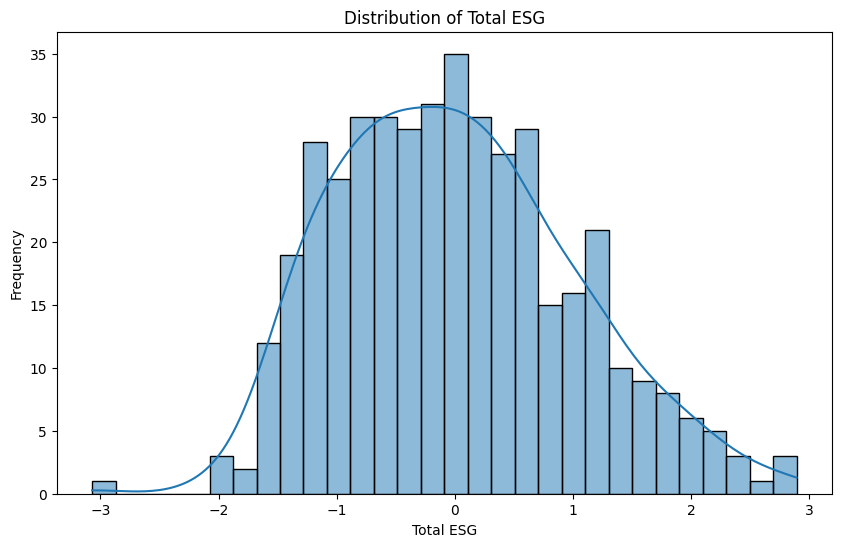

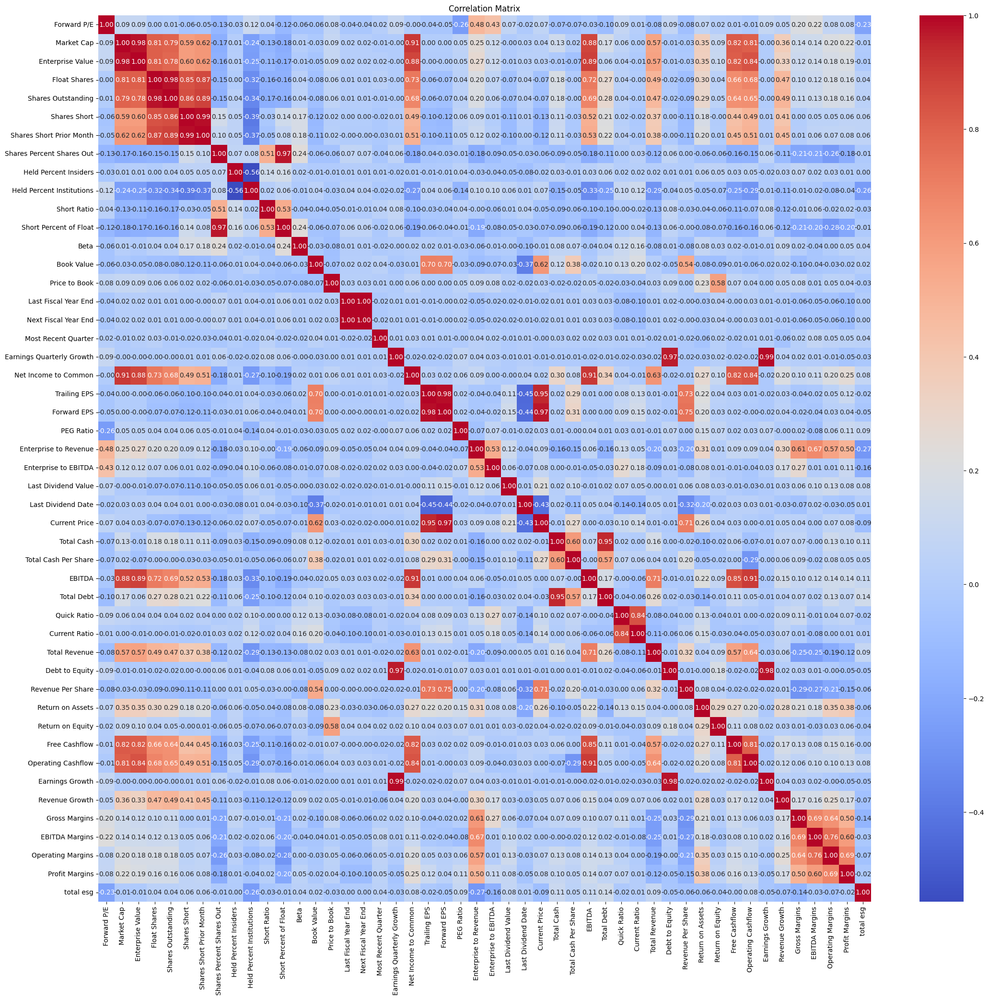

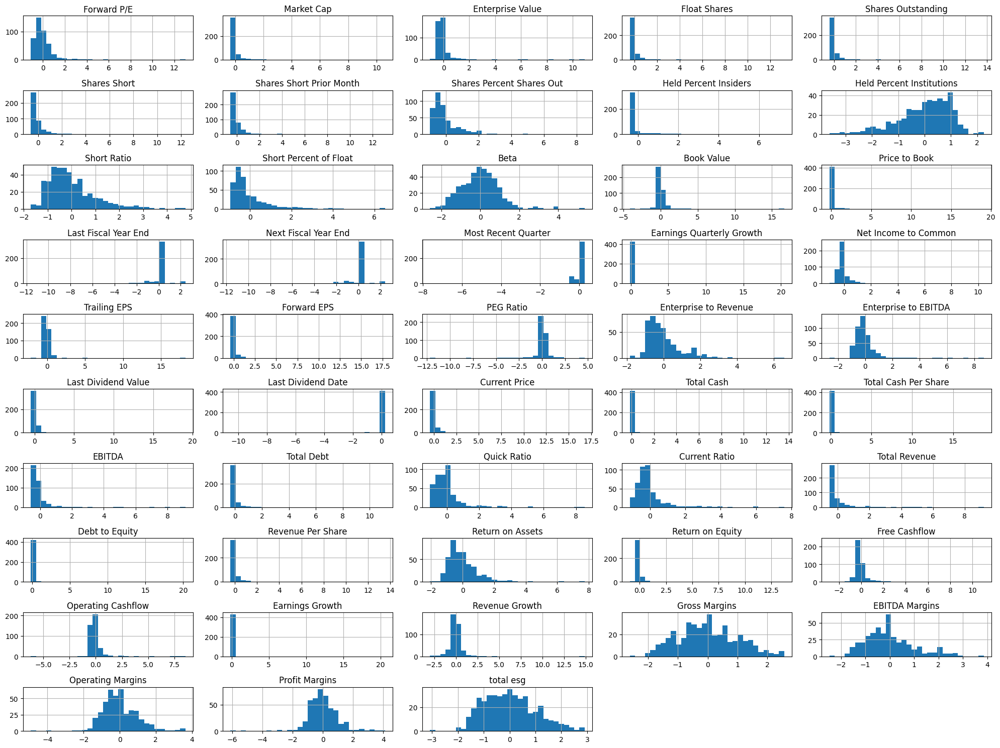

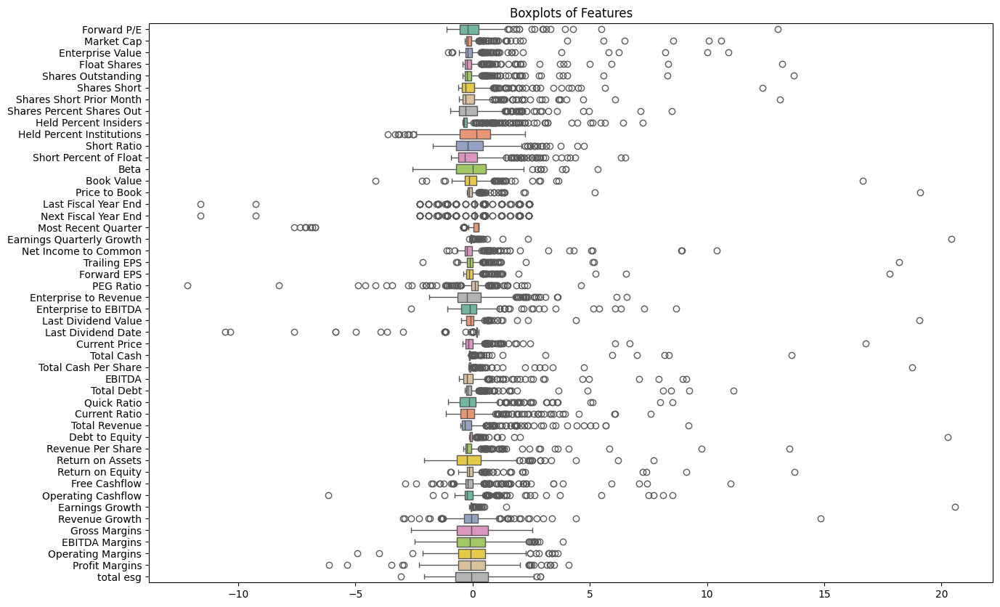

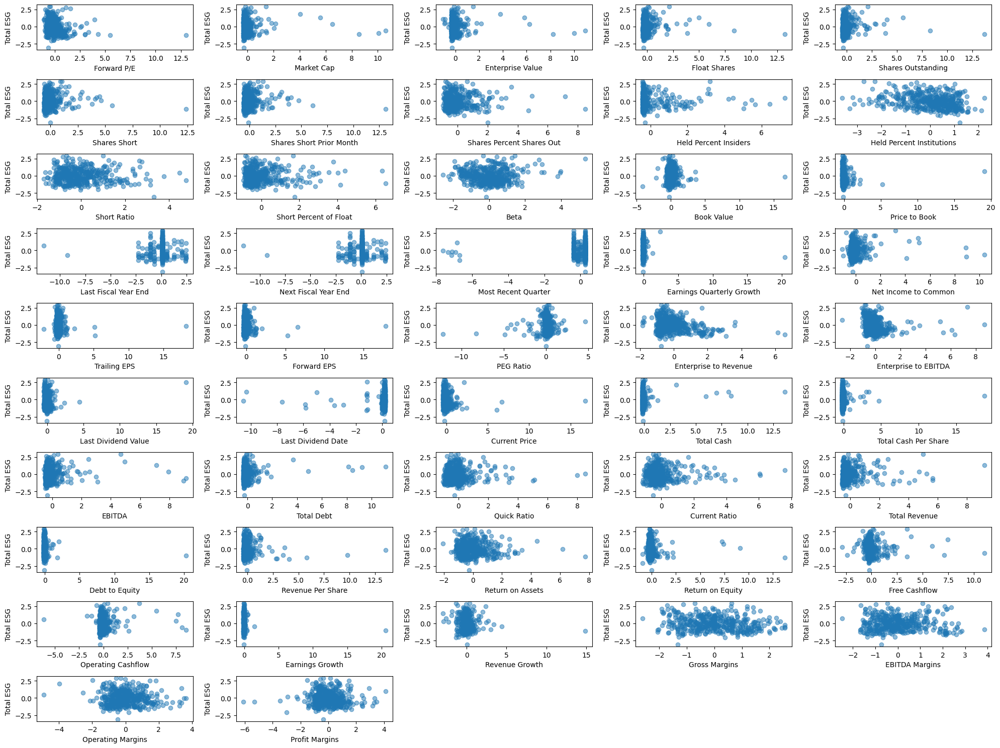

In [ ]:
# EDA
df_imputed.describe()

# Plot the distribution of 'total esg' with KDE
plt.figure(figsize=(10, 6))
sns.histplot(df_imputed['total esg'], bins=30, kde=True)
plt.title('Distribution of Total ESG')
plt.xlabel('Total ESG')
plt.ylabel('Frequency')
plt.show()

# Compute and plot the correlation matrix
correlation_matrix = df_imputed.corr()
plt.figure(figsize=(26, 24))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

# Plot histograms for each feature
nplots = df_imputed.shape[1]
ncols = 5
nrows = (nplots // ncols) + (1 if nplots % ncols != 0 else 0)
df_imputed.hist(bins=30, figsize=(20, 15), layout=(nrows, ncols))
plt.tight_layout()
plt.show()

# Plot boxplots for each feature
plt.figure(figsize=(15, 10))
sns.boxplot(data=df_imputed, orient='h', palette='Set2')
plt.title('Boxplots of Features')
plt.show()

# Scatter plots of each feature against 'total esg'
features_list = df_imputed.columns.drop('total esg')
plt.figure(figsize=(20, 15))
ncols = 5
nrows = (len(features_list) // ncols) + (1 if len(features_list) % ncols != 0 else 0)
for i, feature in enumerate(features_list):
    plt.subplot(nrows, ncols, i + 1)
    plt.scatter(df_imputed[feature], df_imputed['total esg'], alpha=0.5)
    plt.xlabel(feature)
    plt.ylabel('Total ESG')
plt.tight_layout()
plt.show()


#Clustering Analysis

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` ex

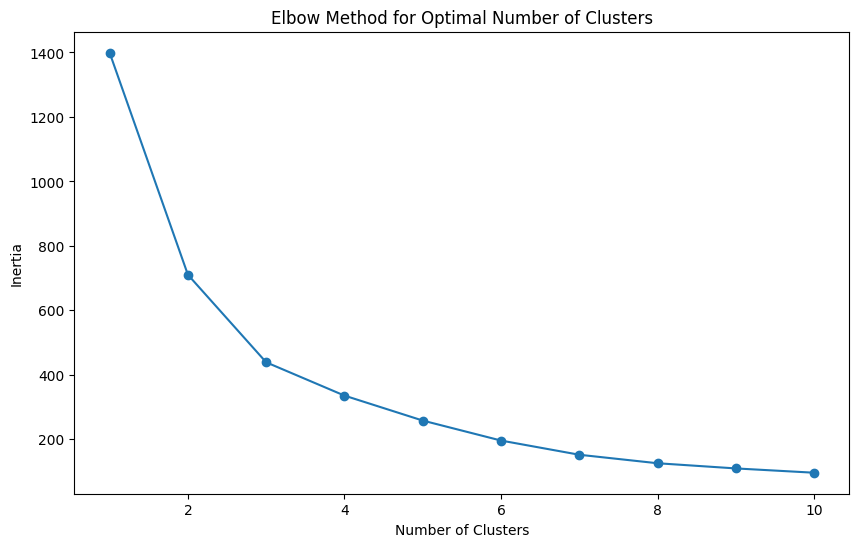

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


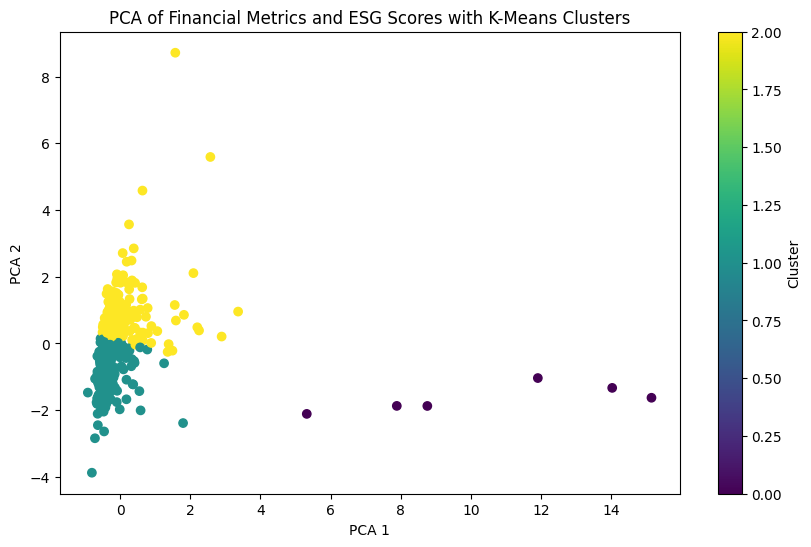

         Forward P/E  Market Cap  Enterprise Value  Float Shares  \
Cluster                                                            
0           0.436555    7.553397          7.492570      6.197952   
1          -0.406552   -0.162291         -0.160632     -0.071290   
2           0.468813   -0.042258         -0.042335     -0.108095   

         Shares Outstanding  Shares Short  Shares Short Prior Month  \
Cluster                                                               
0                  5.864058      4.444388                  4.591990   
1                 -0.070335      0.014360                  0.010555   
2                 -0.098848     -0.155206                 -0.155280   

         Shares Percent Shares Out  Held Percent Insiders  \
Cluster                                                     
0                        -0.757429              -0.007519   
1                         0.106914               0.051818   
2                        -0.103310              -0.061250  

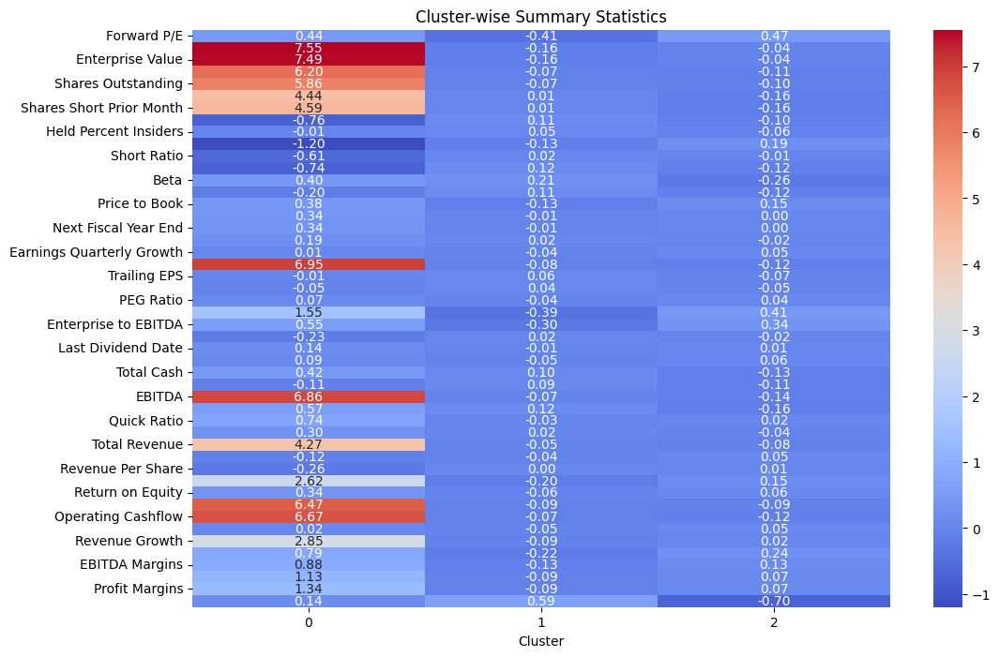

In [ ]:
# Clustering Analysis

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# Select relevant features for clustering (including ESG scores and financial metrics)
features_for_clustering = df_imputed[['total esg', 'Forward P/E', 'Market Cap', 'Enterprise Value', 'Beta', 'Price to Book']]

# Perform PCA for visualization purposes (reduce to 2D)
pca = PCA(n_components=2)
pca_result = pca.fit_transform(features_for_clustering)

# Determine the optimal number of clusters using the elbow method
inertia = []
for n in range(1, 11):
    kmeans = KMeans(n_clusters=n, random_state=42)
    kmeans.fit(pca_result)
    inertia.append(kmeans.inertia_)

# Plot the elbow curve
plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), inertia, marker='o')
plt.title('Elbow Method for Optimal Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.show()

optimal_clusters = 3  #adjusted based on the elbow plot

# K-Means clustering
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
clusters = kmeans.fit_predict(pca_result)

# Add the cluster labels to the original dataframe
df_imputed['Cluster'] = clusters

# Plot the PCA results with clusters
plt.figure(figsize=(10, 6))
plt.scatter(pca_result[:, 0], pca_result[:, 1], c=clusters, cmap='viridis')
plt.title('PCA of Financial Metrics and ESG Scores with K-Means Clusters')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.colorbar(label='Cluster')
plt.show()

# Group by clusters and calculate the mean of each feature within each cluster
cluster_summary = df_imputed.groupby('Cluster').mean()

# Display the summary statistics for each cluster
print(cluster_summary)
plt.figure(figsize=(12, 8))
sns.heatmap(cluster_summary.T, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Cluster-wise Summary Statistics')
plt.show()


#Models and Evaluation

Ridge and Lasso Regression

In [ ]:
from sklearn.linear_model import Ridge, Lasso
from sklearn.model_selection import GridSearchCV

# Define Ridge and Lasso models
ridge_model = Ridge()
lasso_model = Lasso()

# Define the parameter grid for Ridge and Lasso
ridge_params = {
    'alpha': [0.1, 1, 10, 100],
    'max_iter': [1000, 10000]
}

lasso_params = {
    'alpha': [0.1, 1, 10, 100],
    'max_iter': [1000, 10000]
}

# Perform Grid Search for Ridge
ridge_grid_search = GridSearchCV(estimator=ridge_model, param_grid=ridge_params, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
ridge_grid_search.fit(X_train, y_train)
best_ridge_model = ridge_grid_search.best_estimator_

print("Ridge best parameters:", ridge_grid_search.best_params_)

# Perform Grid Search for Lasso
lasso_grid_search = GridSearchCV(estimator=lasso_model, param_grid=lasso_params, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
lasso_grid_search.fit(X_train, y_train)
best_lasso_model = lasso_grid_search.best_estimator_

print("Lasso best parameters:", lasso_grid_search.best_params_)


Ridge best parameters: {'alpha': 100, 'max_iter': 1000}
Lasso best parameters: {'alpha': 0.1, 'max_iter': 1000}


In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Evaluate Ridge on the test set
ridge_y_pred = best_ridge_model.predict(X_test)
ridge_mse = mean_squared_error(y_test, ridge_y_pred)
ridge_rmse = np.sqrt(ridge_mse)
ridge_mae = mean_absolute_error(y_test, ridge_y_pred)
ridge_r2 = r2_score(y_test, ridge_y_pred)

# Print Ridge evaluation metrics
print("\nRidge Model Evaluation Metrics:")
print(f"Ridge MSE: {ridge_mse:.4f}")
print(f"Ridge RMSE: {ridge_rmse:.4f}")
print(f"Ridge MAE: {ridge_mae:.4f}")
print(f"Ridge R2: {ridge_r2:.4f}")

# Evaluate Lasso on the test set
lasso_y_pred = best_lasso_model.predict(X_test)
lasso_mse = mean_squared_error(y_test, lasso_y_pred)
lasso_rmse = np.sqrt(lasso_mse)
lasso_mae = mean_absolute_error(y_test, lasso_y_pred)
lasso_r2 = r2_score(y_test, lasso_y_pred)

# Print Lasso evaluation metrics
print("\nLasso Model Evaluation Metrics:")
print(f"Lasso MSE: {lasso_mse:.4f}")
print(f"Lasso RMSE: {lasso_rmse:.4f}")
print(f"Lasso MAE: {lasso_mae:.4f}")
print(f"Lasso R2: {lasso_r2:.4f}")



Ridge Model Evaluation Metrics:
Ridge MSE: 1.1930
Ridge RMSE: 1.0923
Ridge MAE: 0.8520
Ridge R2: 0.0851

Lasso Model Evaluation Metrics:
Lasso MSE: 1.1869
Lasso RMSE: 1.0895
Lasso MAE: 0.8645
Lasso R2: 0.0898


GBM, XGB, SVM, RF

In [ ]:
# Model initialization
models = {
    'GradientBoosting': GradientBoostingRegressor(),
    'XGBoost': xgb.XGBRegressor(),
    'SVM': SVR(),
    'RandomForest': RandomForestRegressor()
}

In [ ]:
# Feature selection using RFE
from sklearn.feature_selection import RFE

support_masks = {}
selected_features_dict = {}

for name, model in models.items():
    if name != 'SVM':
        rfe = RFE(model, n_features_to_select=14)
        rfe.fit(X_train, y_train)
        support_masks[name] = rfe.support_
    else:
        support_masks[name] = np.ones(X_train.shape[1], dtype=bool)  # Use all features for SVM

    selected_features_dict[name] = X_train.columns[support_masks[name]]

# Display selected features for each model
for name, features in selected_features_dict.items():
    print(f"{name} selected features: {features}")


GradientBoosting selected features: Index(['Forward P/E', 'Held Percent Institutions', 'Short Ratio', 'Beta',
       'Book Value', 'Price to Book', 'Earnings Quarterly Growth',
       'Enterprise to Revenue', 'Enterprise to EBITDA', 'Revenue Per Share',
       'Free Cashflow', 'Operating Cashflow', 'Gross Margins',
       'EBITDA Margins'],
      dtype='object')
XGBoost selected features: Index(['Held Percent Institutions', 'Price to Book', 'Most Recent Quarter',
       'Earnings Quarterly Growth', 'PEG Ratio', 'Enterprise to Revenue',
       'Enterprise to EBITDA', 'Current Ratio', 'Revenue Per Share',
       'Free Cashflow', 'Revenue Growth', 'Gross Margins', 'EBITDA Margins',
       'Profit Margins'],
      dtype='object')
SVM selected features: Index(['Forward P/E', 'Market Cap', 'Enterprise Value', 'Float Shares',
       'Shares Outstanding', 'Shares Short', 'Shares Short Prior Month',
       'Shares Percent Shares Out', 'Held Percent Insiders',
       'Held Percent Institutions',

In [ ]:
# Add regularization parameters for GBM and XGBoost in the parameter grids
param_grids = {
    'GradientBoosting': {
        'n_estimators': [100, 200],
        'learning_rate': [0.01, 0.1],
        'max_depth': [3, 4, 5],
        'alpha': [0.1, 0.5, 1],  # Add regularization parameter
        'subsample': [0.8, 1.0]  # Optional: Add subsample for more robust models
    },
    'XGBoost': {
        'n_estimators': [100, 200],
        'learning_rate': [0.01, 0.1],
        'max_depth': [3, 4, 5],
        'alpha': [0.1, 0.5, 1],  # L1 regularization term on weights
        'lambda': [1, 1.5, 2]  # L2 regularization term on weights
    },
    'SVM': {
        'C': [0.1, 1, 10],
        'epsilon': [0.01, 0.1, 0.2],
        'kernel': ['linear', 'rbf']
    },
    'RandomForest': {
        'n_estimators': [100, 200],
        'max_depth': [10, 20, None],
        'min_samples_split': [2, 5, 10]
    }
}


In [ ]:
# Grid search for hyperparameter tuning
best_models = {}

for name, model in models.items():
    X_train_rfe = X_train.loc[:, support_masks[name]]
    grid_search = GridSearchCV(estimator=model, param_grid=param_grids[name], cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
    grid_search.fit(X_train_rfe, y_train)
    best_models[name] = grid_search.best_estimator_

    print(f"{name} best parameters: {grid_search.best_params_}")


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:425: FitFailedWarning: 
120 fits failed out of a total of 360.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
120 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1145, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 638, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/util

GradientBoosting best parameters: {'alpha': 0.5, 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.8}
XGBoost best parameters: {'alpha': 0.1, 'lambda': 2, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 200}
SVM best parameters: {'C': 1, 'epsilon': 0.2, 'kernel': 'rbf'}
RandomForest best parameters: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 200}


In [ ]:
# Model evaluation on the test set
results = {}

for name, model in best_models.items():
    X_train_rfe = X_train.loc[:, support_masks[name]]
    X_test_rfe = X_test.loc[:, support_masks[name]]

    # Model evaluation on the test set
    y_pred = model.predict(X_test_rfe)

    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    results[name] = {
        'Best Params': model.get_params(),
        'MSE': mse,
        'RMSE': rmse,
        'MAE': mae,
        'R2': r2
    }

# Display the results
for model_name, metrics in results.items():
    print(f"\n{model_name} Model Evaluation Metrics:")
    for metric_name, value in metrics.items():
        if metric_name == 'Best Params':
            print(f"{metric_name}: {value}")
        else:
            print(f"{metric_name}: {value:.4f}")


GradientBoosting Model Evaluation Metrics:
Best Params: {'alpha': 0.5, 'ccp_alpha': 0.0, 'criterion': 'friedman_mse', 'init': None, 'learning_rate': 0.01, 'loss': 'squared_error', 'max_depth': 5, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 200, 'n_iter_no_change': None, 'random_state': None, 'subsample': 0.8, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}
MSE: 1.0566
RMSE: 1.0279
MAE: 0.7905
R2: 0.1897

XGBoost Model Evaluation Metrics:
Best Params: {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': None, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': None, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'le

In [ ]:
# K-Fold cross-validation
for name, model in best_models.items():
    X_rfe = X.loc[:, support_masks[name]]

    kf = KFold(n_splits=5, random_state=42, shuffle=True)
    cv_mse_scores = cross_val_score(model, X_rfe, y, cv=kf, scoring='neg_mean_squared_error')
    cv_rmse_scores = np.sqrt(-cv_mse_scores)
    cv_mae_scores = cross_val_score(model, X_rfe, y, cv=kf, scoring='neg_mean_absolute_error')
    cv_r2_scores = cross_val_score(model, X_rfe, y, cv=kf, scoring='r2')

    results[name]['CV MSE'] = cv_mse_scores
    results[name]['Mean CV MSE'] = np.mean(cv_mse_scores)
    results[name]['CV RMSE'] = cv_rmse_scores
    results[name]['Mean CV RMSE'] = np.mean(cv_rmse_scores)
    results[name]['CV MAE'] = cv_mae_scores
    results[name]['Mean CV MAE'] = np.mean(cv_mae_scores)
    results[name]['CV R2'] = cv_r2_scores
    results[name]['Mean CV R2'] = np.mean(cv_r2_scores)

# Display cross-validation results
for model_name, metrics in results.items():
    print(f"\n{model_name} Cross-Validation Metrics:")
    for metric_name, value in metrics.items():
        if metric_name == 'Best Params':
            print(f"{metric_name}: {value}")
        elif isinstance(value, np.ndarray):
            print(f"{metric_name}: {value}")
        else:
            print(f"{metric_name}: {value:.4f}")


GradientBoosting Cross-Validation Metrics:
Best Params: {'alpha': 0.5, 'ccp_alpha': 0.0, 'criterion': 'friedman_mse', 'init': None, 'learning_rate': 0.01, 'loss': 'squared_error', 'max_depth': 5, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 200, 'n_iter_no_change': None, 'random_state': None, 'subsample': 0.8, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}
MSE: 1.0566
RMSE: 1.0279
MAE: 0.7905
R2: 0.1897
CV MSE: [-1.05637566 -0.73729689 -0.65756861 -0.60476908 -0.75270698]
Mean CV MSE: -0.7617
CV RMSE: [1.02780137 0.85865994 0.81090604 0.777669   0.86758687]
Mean CV RMSE: 0.8685
CV MAE: [-0.79554447 -0.68175376 -0.62997058 -0.65462131 -0.71552853]
Mean CV MAE: -0.6955
CV R2: [0.18540172 0.19791653 0.24576189 0.34969568 0.14936103]
Mean CV R2: 0.2256

XGBoost Cross-Validation Metrics:
Best Params: {'objective': 'reg:squarederror', 

Bagging and stacking models

In [ ]:
# Bagging and Stacking

from sklearn.ensemble import BaggingRegressor, StackingRegressor
from sklearn.linear_model import LinearRegression

# Bagging Regressor
bagging_model = BaggingRegressor(base_estimator=RandomForestRegressor(), n_estimators=10, random_state=42)
bagging_model.fit(X_train, y_train)
bagging_y_pred = bagging_model.predict(X_test)

# Stacking Regressor
estimators = [
    ('rf', RandomForestRegressor()),
    ('svr', SVR())
]

stacking_model = StackingRegressor(estimators=estimators, final_estimator=LinearRegression())
stacking_model.fit(X_train, y_train)
stacking_y_pred = stacking_model.predict(X_test)

# Evaluate Bagging and Stacking
bagging_mse = mean_squared_error(y_test, bagging_y_pred)
bagging_rmse = np.sqrt(bagging_mse)
bagging_mae = mean_absolute_error(y_test, bagging_y_pred)
bagging_r2 = r2_score(y_test, bagging_y_pred)

stacking_mse = mean_squared_error(y_test, stacking_y_pred)
stacking_rmse = np.sqrt(stacking_mse)
stacking_mae = mean_absolute_error(y_test, stacking_y_pred)
stacking_r2 = r2_score(y_test, stacking_y_pred)

print(f"Bagging RMSE: {bagging_rmse:.4f}, R²: {bagging_r2:.4f}")
print(f"Stacking RMSE: {stacking_rmse:.4f}, R²: {stacking_r2:.4f}")

# Add Bagging and Stacking results to the results dictionary for visualization
results['Bagging'] = {
    'MSE': bagging_mse,
    'RMSE': bagging_rmse,
    'MAE': bagging_mae,
    'R2': bagging_r2
}

results['Stacking'] = {
    'MSE': stacking_mse,
    'RMSE': stacking_rmse,
    'MAE': stacking_mae,
    'R2': stacking_r2
}


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


Bagging RMSE: 1.0204, R²: 0.2015
Stacking RMSE: 0.9836, R²: 0.2581


# Explainable AI (XAI) Analysis


GradientBoosting Model SHAP Analysis


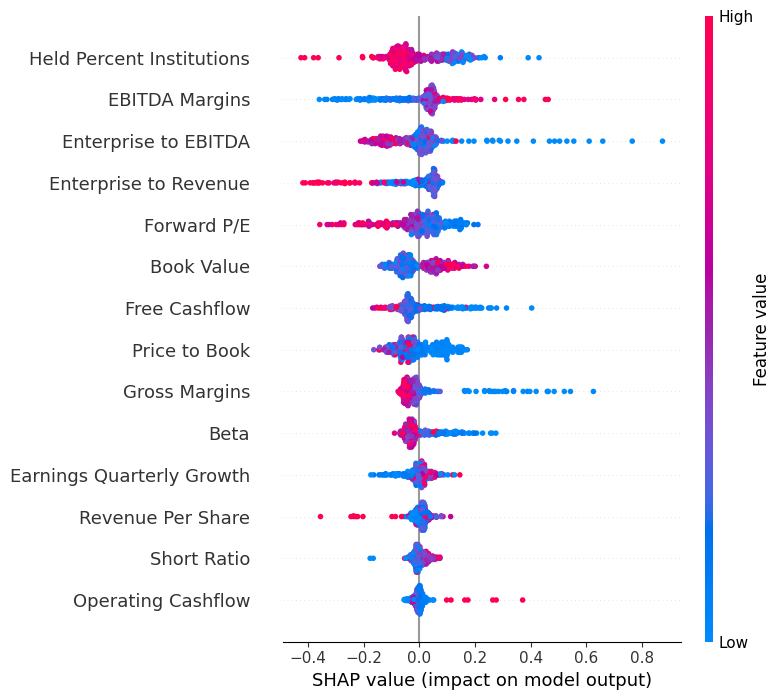


XGBoost Model SHAP Analysis


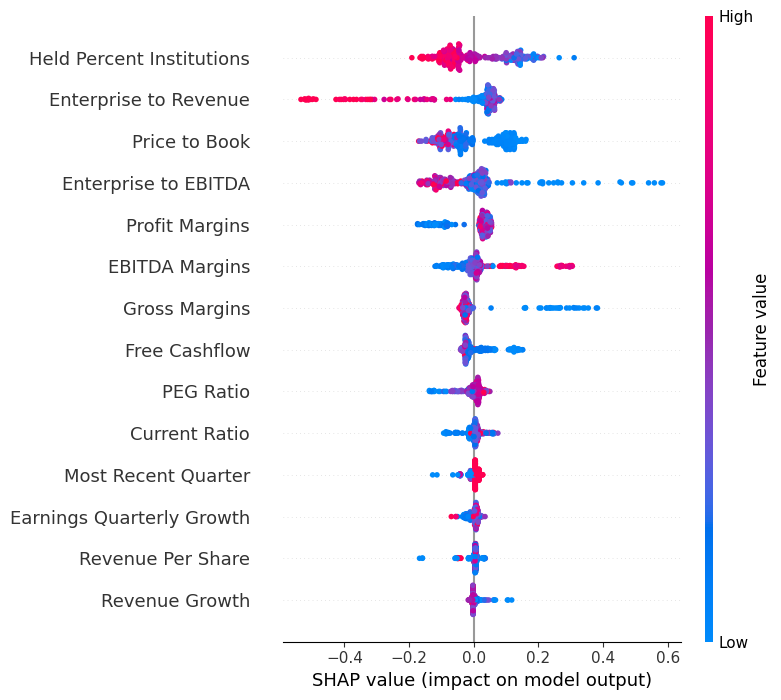


SVM Model SHAP Analysis


  0%|          | 0/342 [00:00<?, ?it/s]

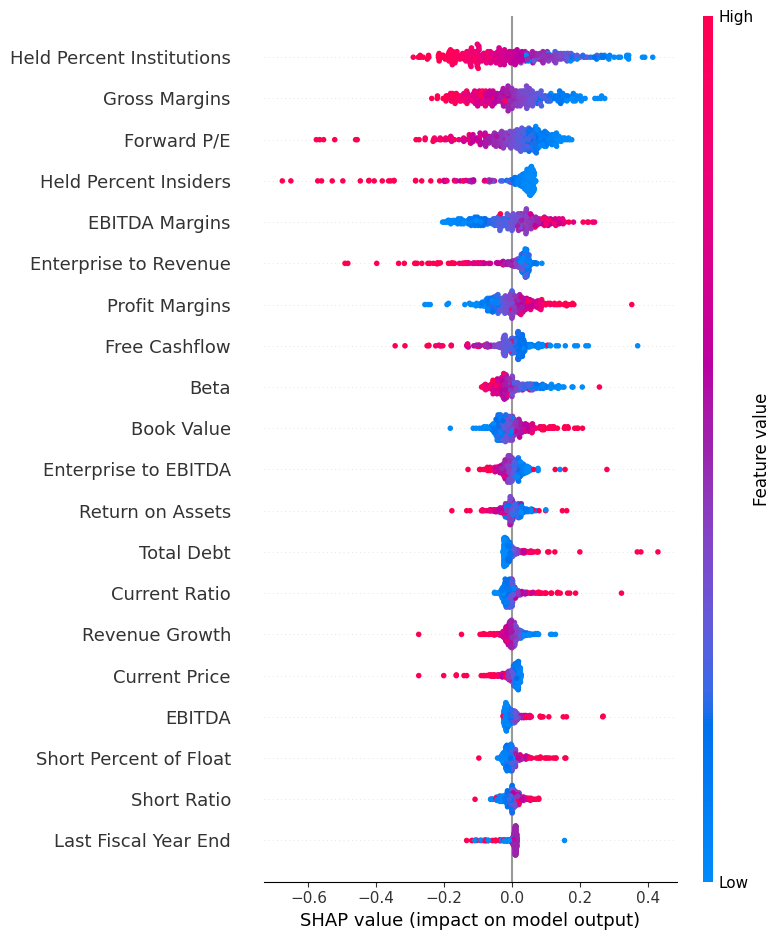


RandomForest Model SHAP Analysis


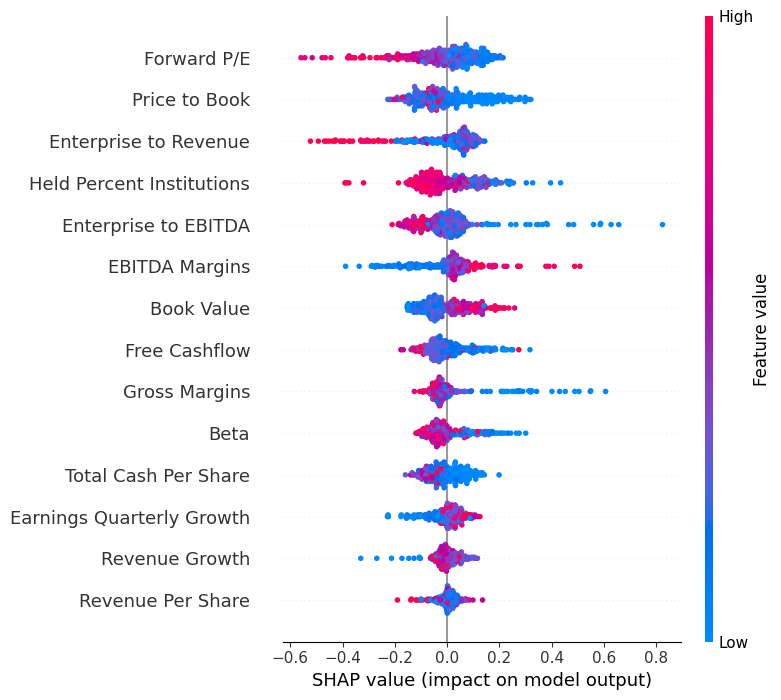

In [ ]:
# Explainable AI (XAI) with SHAP
for name, model in best_models.items():
    print(f"\n{name} Model SHAP Analysis")

    if name != 'SVM':
        selected_features = X_train.columns[support_masks[name]]
        X_train_rfe = X_train.loc[:, support_masks[name]]
    else:
        selected_features = X_train.columns
        X_train_rfe = X_train

    best_model = best_models[name]

    # Create a SHAP explainer
    if name in ['GradientBoosting', 'XGBoost', 'RandomForest']:
        explainer = shap.TreeExplainer(best_model)
    else:
        explainer = shap.KernelExplainer(best_model.predict, X_train_rfe)

    shap_values = explainer.shap_values(X_train_rfe)

    # Plot SHAP summary
    shap.summary_plot(shap_values, X_train_rfe, feature_names=selected_features)



GradientBoosting Model SHAP Dependence Plots


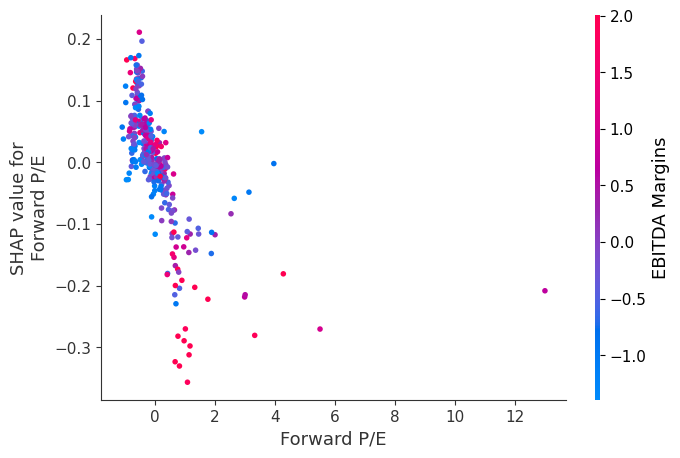

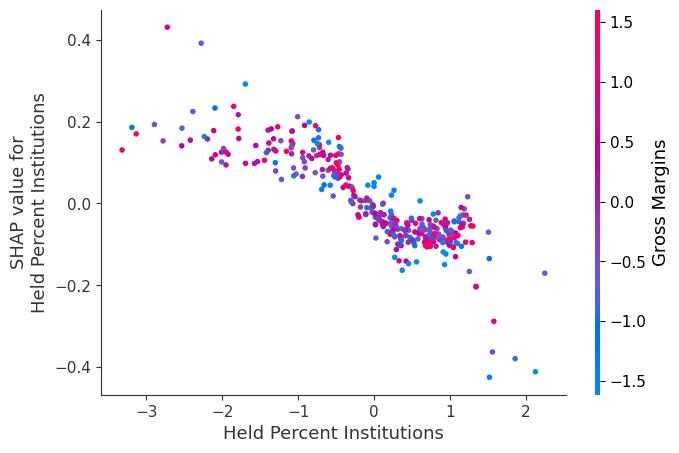

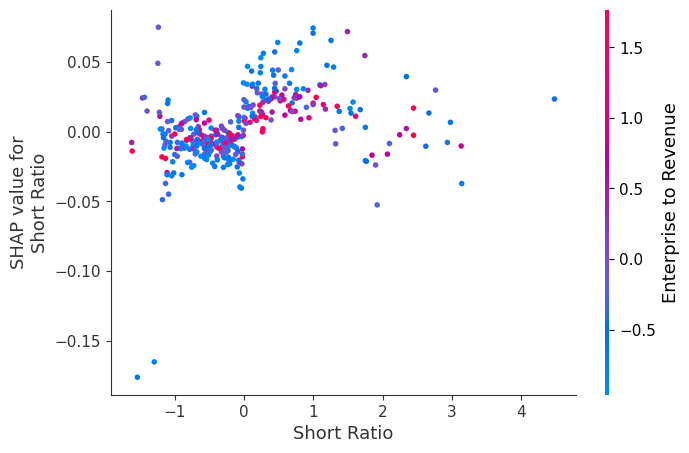

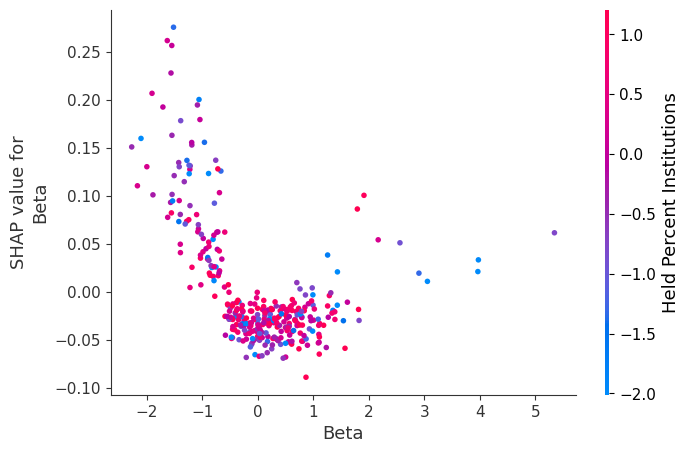

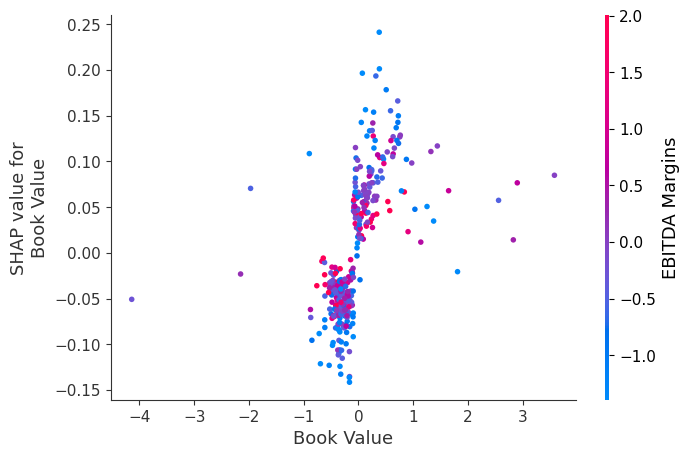

...

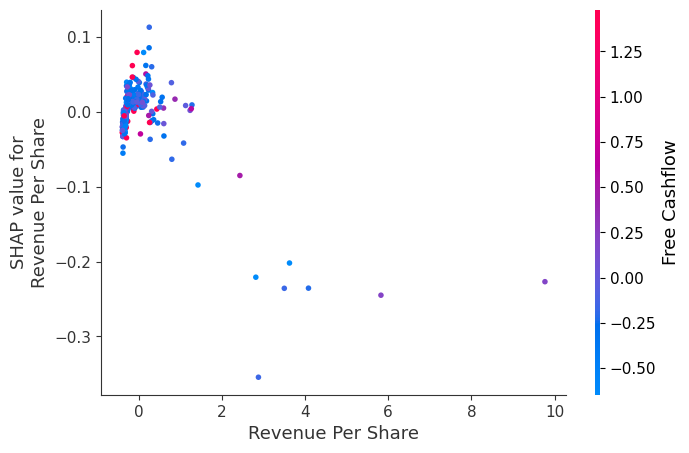

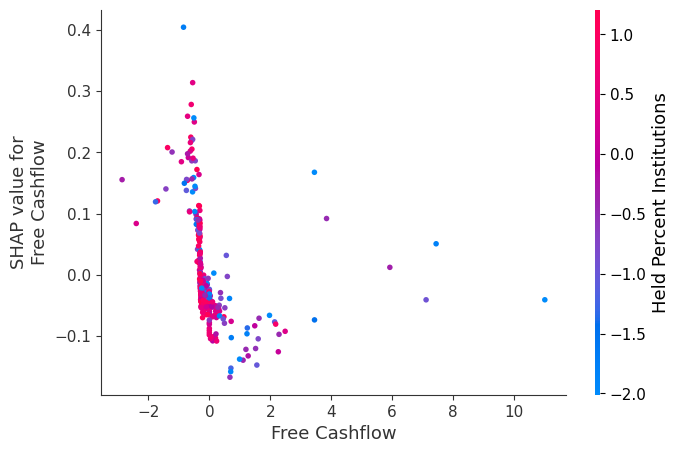

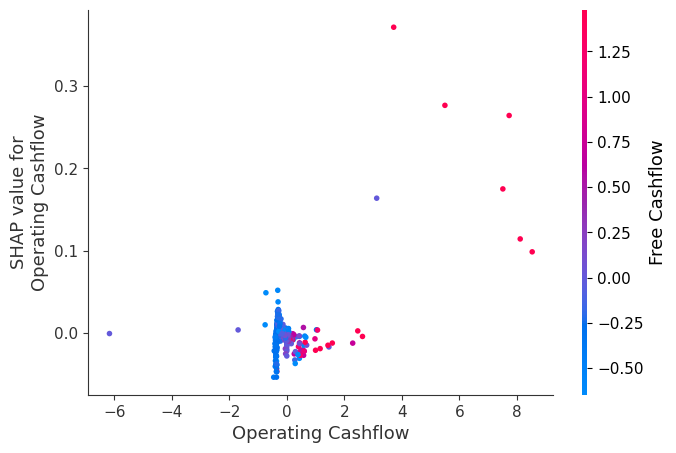

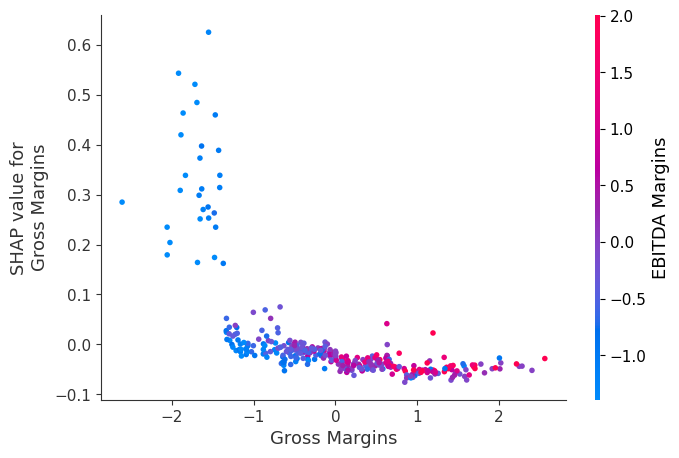

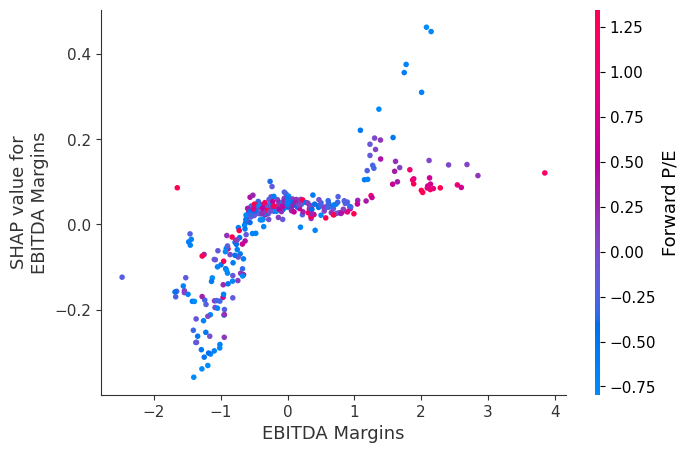


XGBoost Model SHAP Dependence Plots


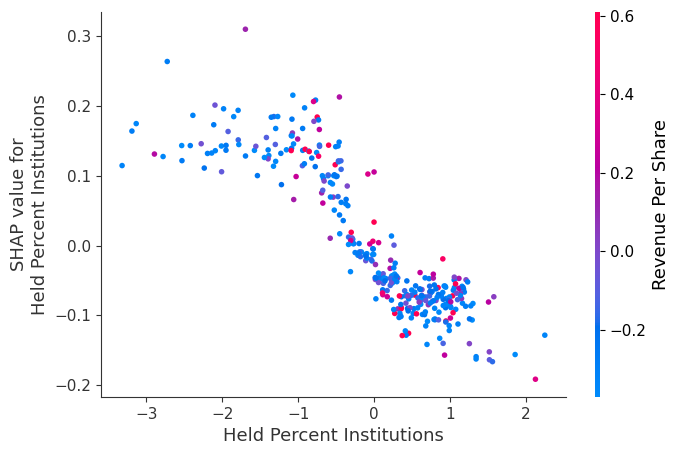

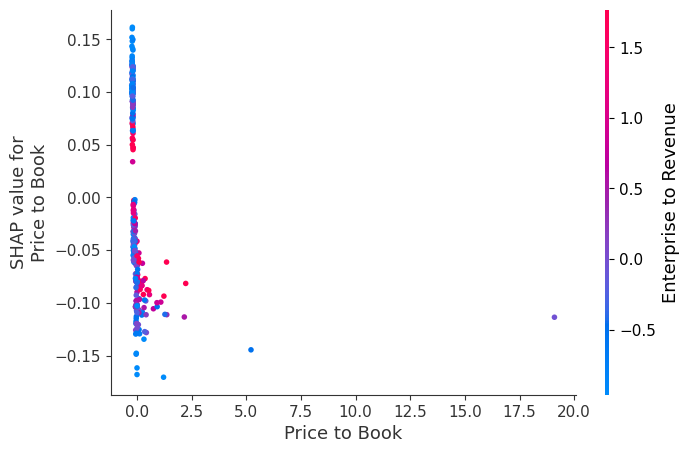

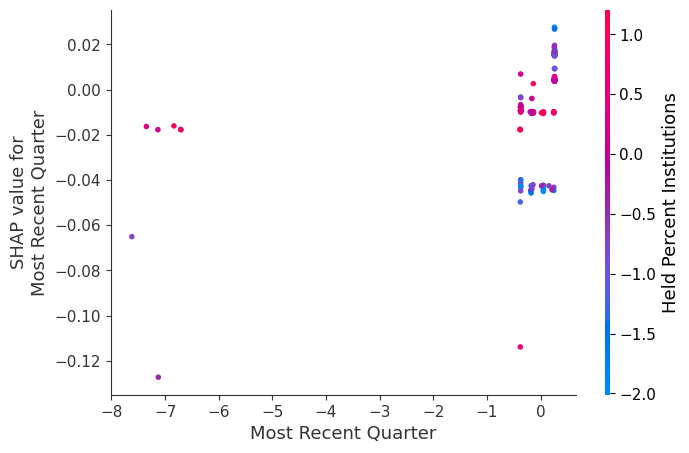

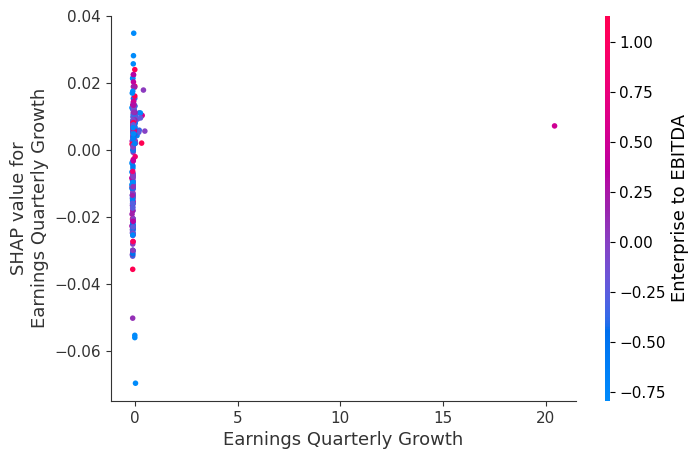

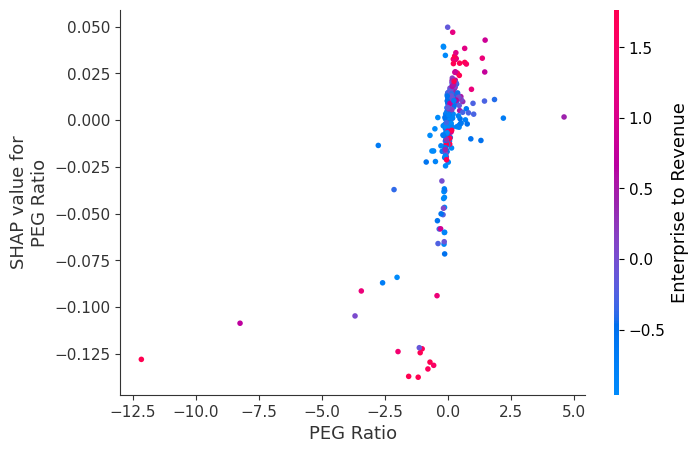

...

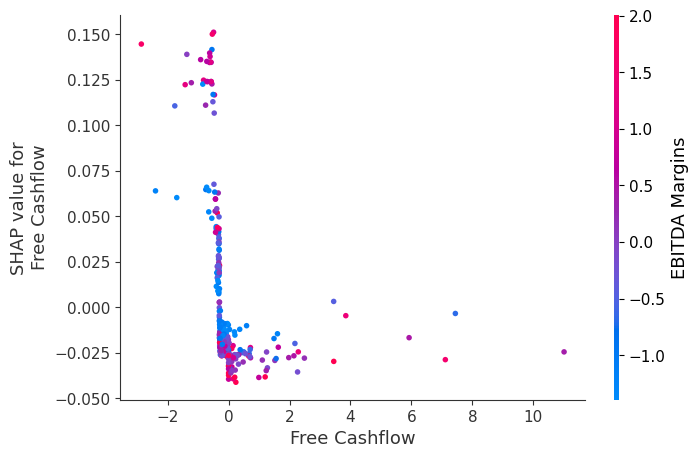

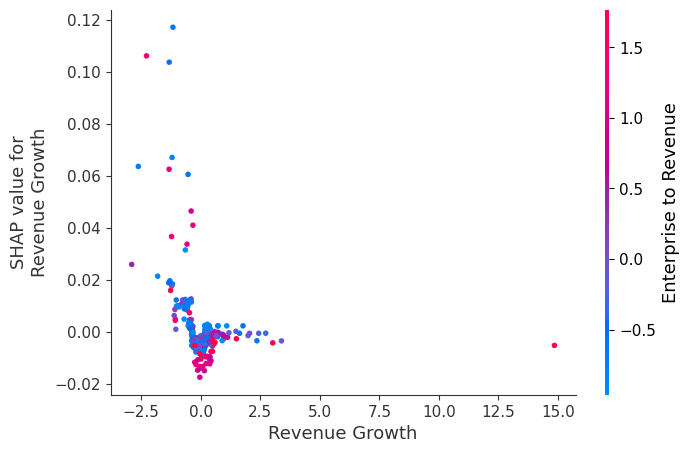

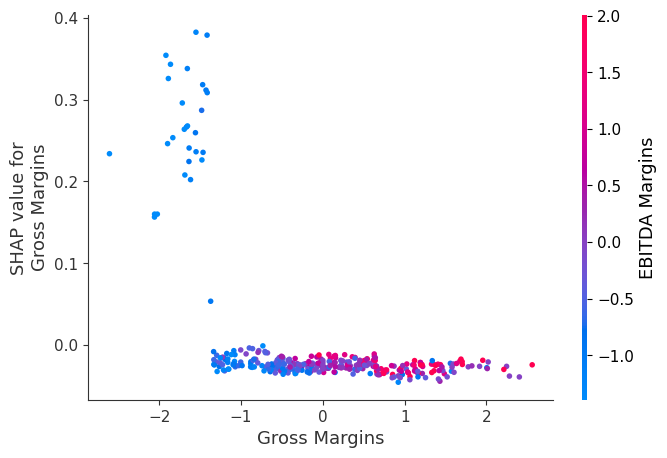

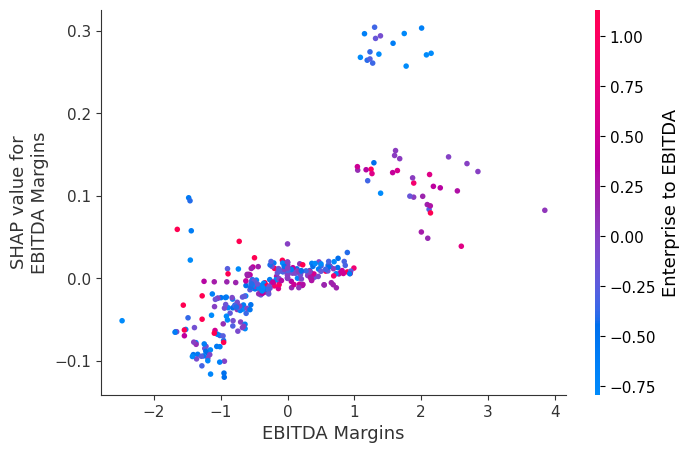

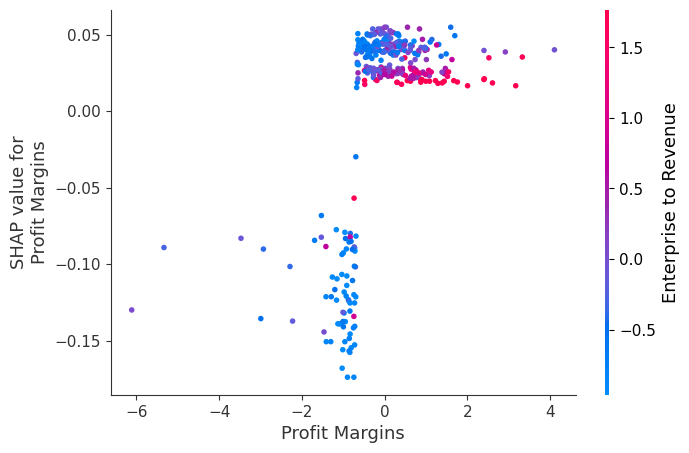


SVM Model SHAP Dependence Plots


  0%|          | 0/342 [00:00<?, ?it/s]

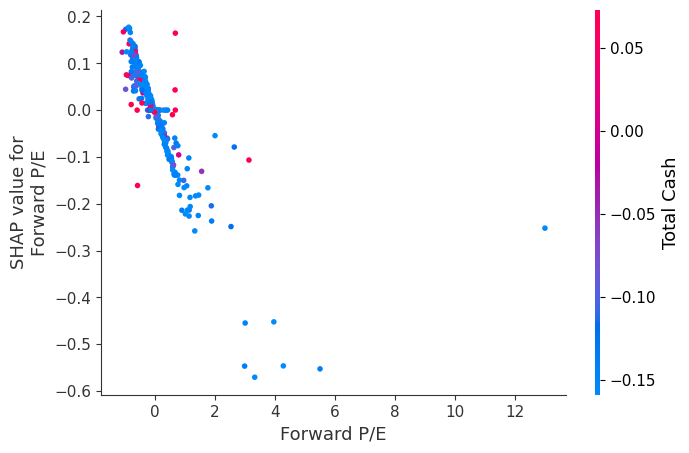

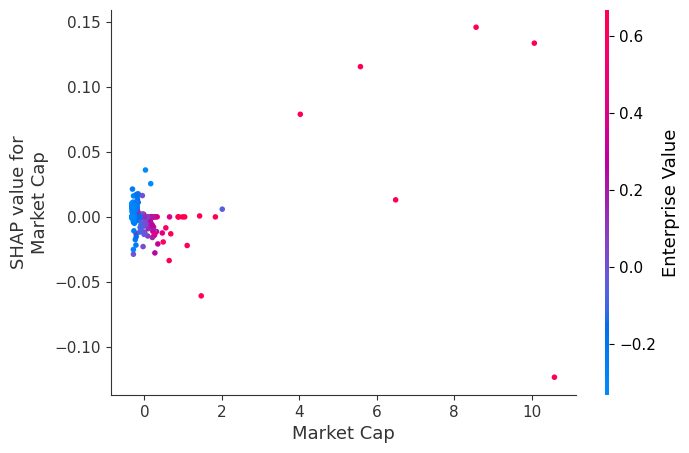

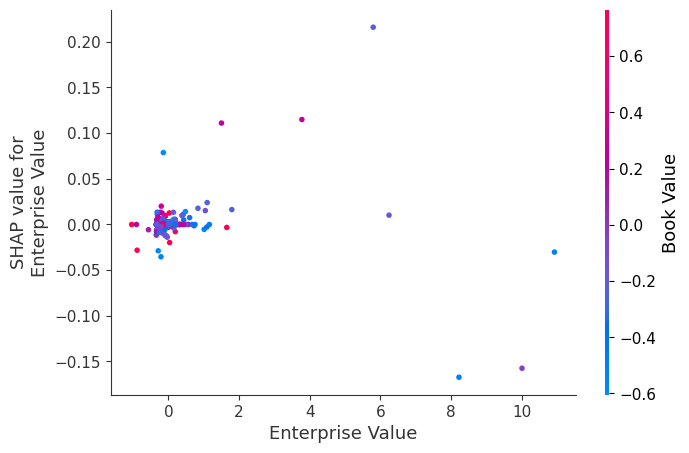

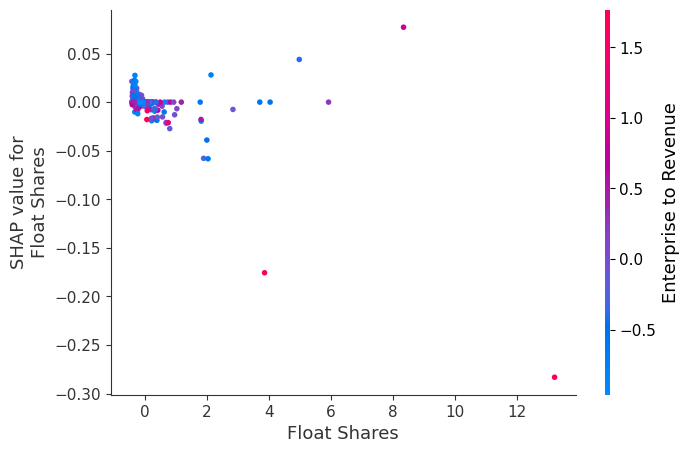

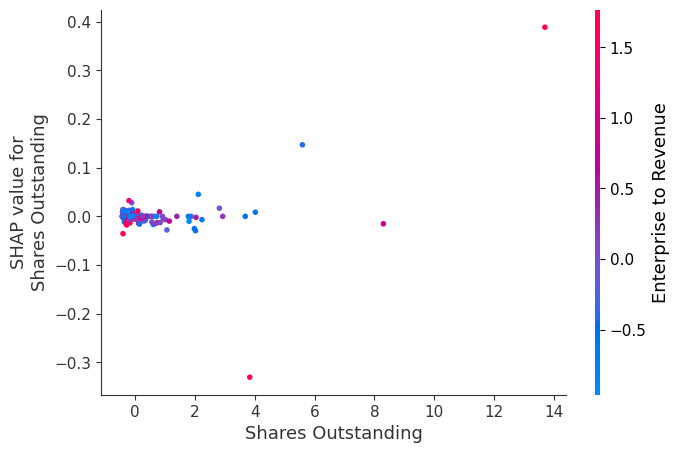

...

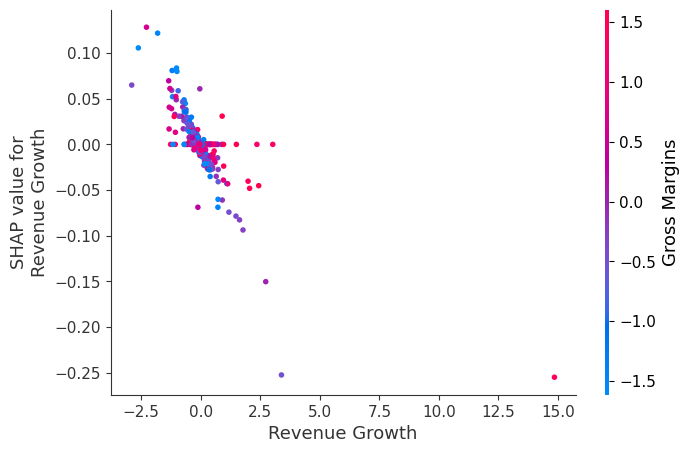

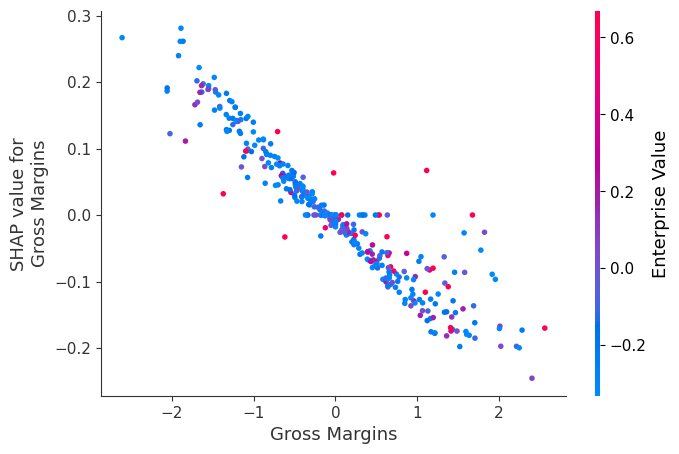

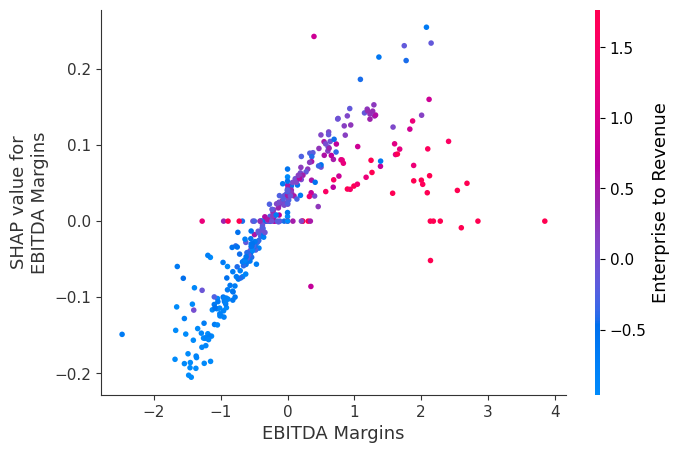

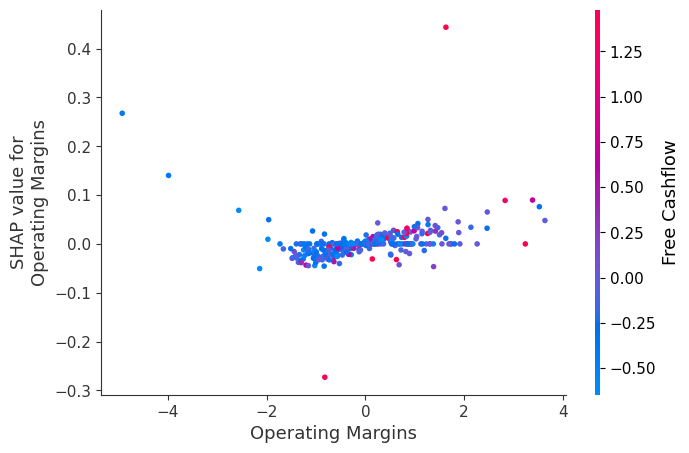

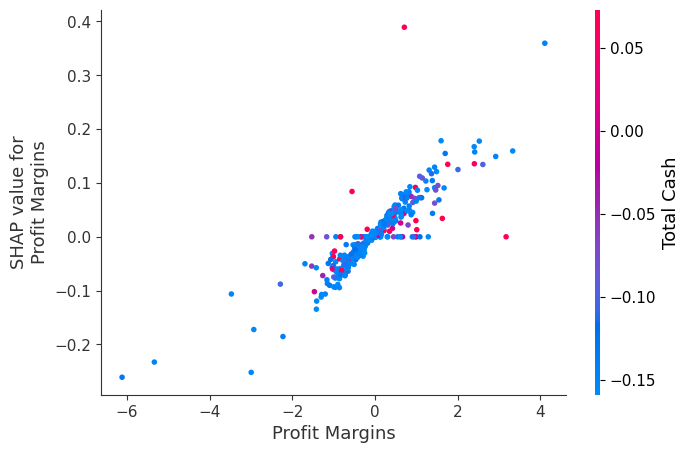


RandomForest Model SHAP Dependence Plots


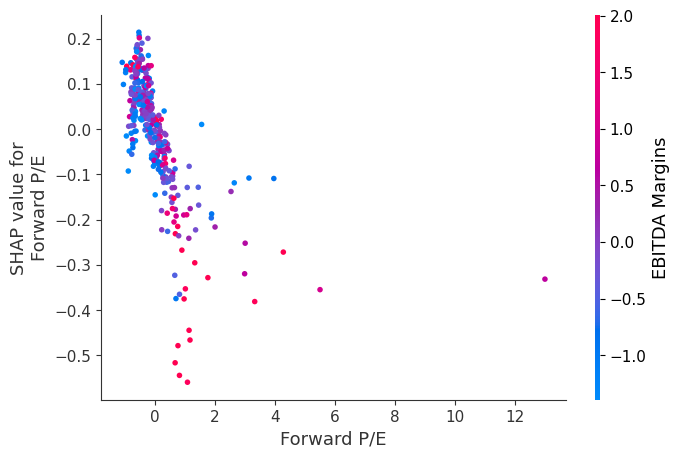

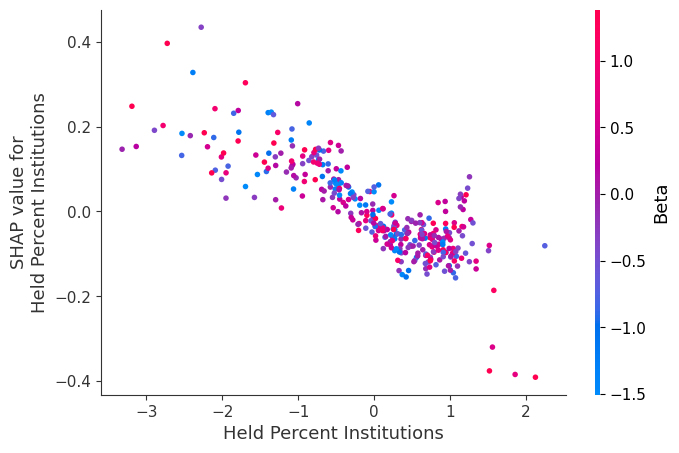

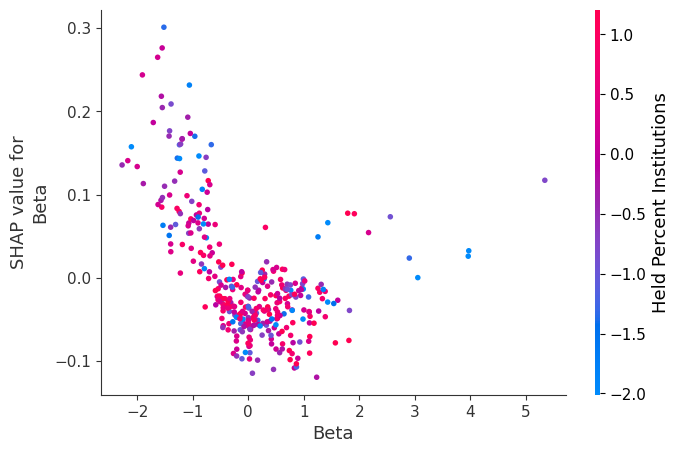

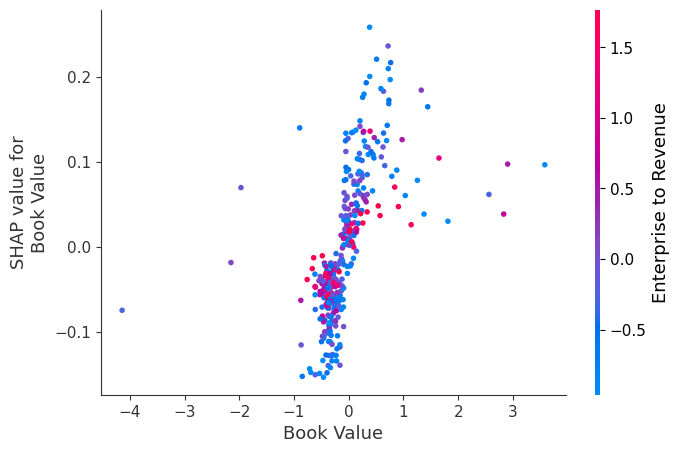

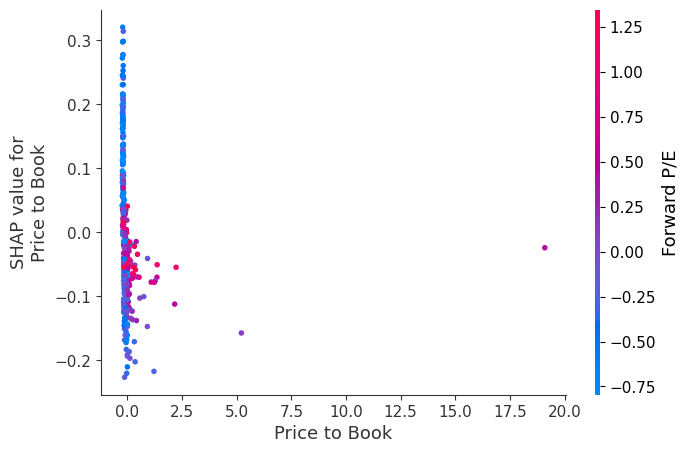

...

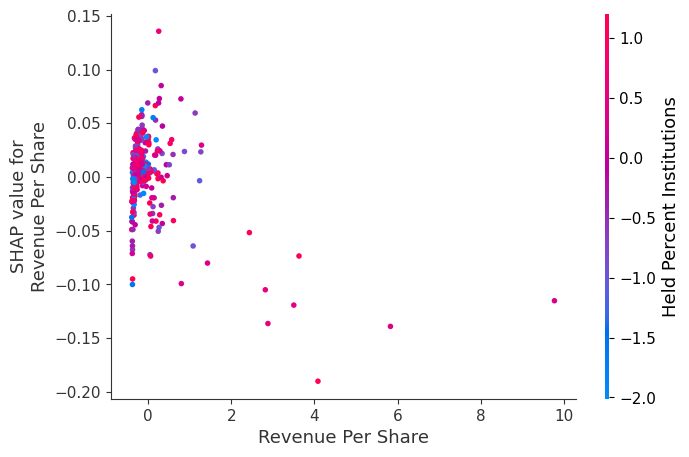

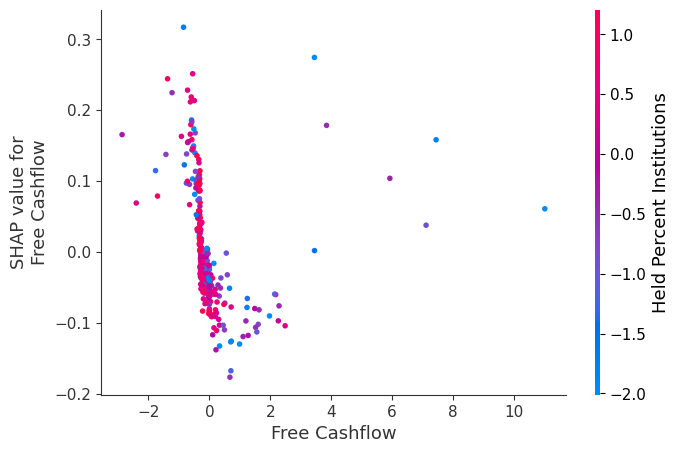

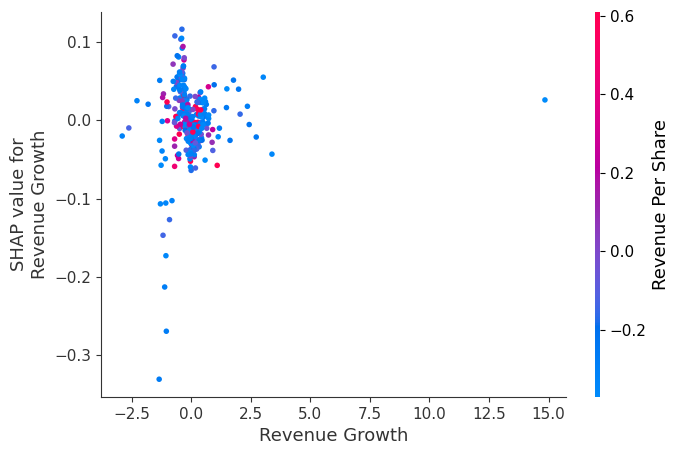

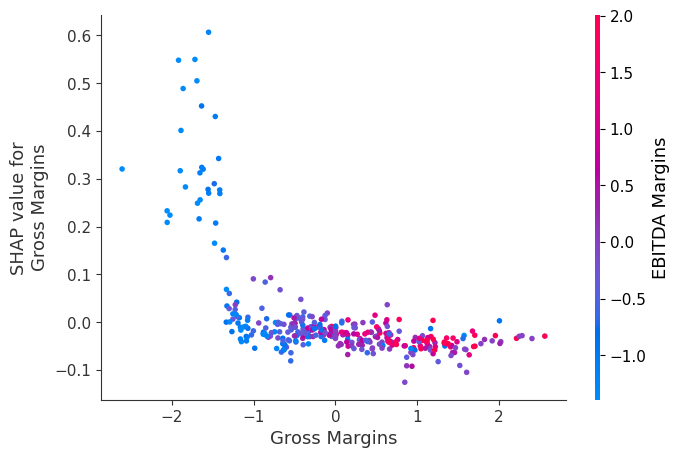

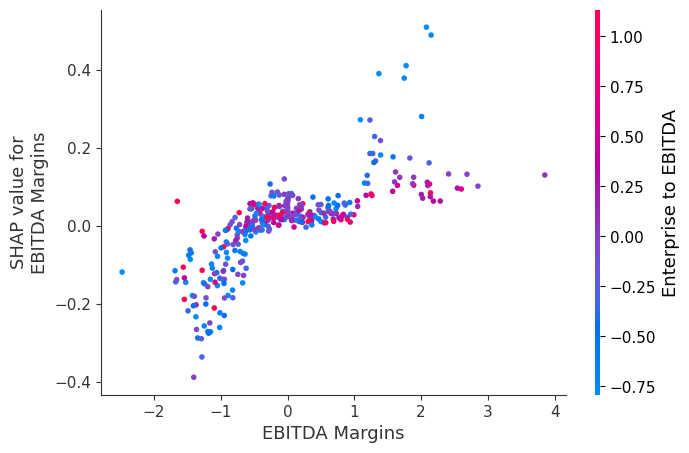

In [ ]:
# Generate SHAP dependence plots
for name, model in best_models.items():
    print(f"\n{name} Model SHAP Dependence Plots")

    if name != 'SVM':
        selected_features = X_train.columns[support_masks[name]]
        X_train_rfe = X_train.loc[:, support_masks[name]]
    else:
        selected_features = X_train.columns
        X_train_rfe = X_train

    best_model = best_models[name]

    if name in ['GradientBoosting', 'XGBoost', 'RandomForest']:
        explainer = shap.TreeExplainer(best_model)
        shap_values = explainer.shap_values(X_train_rfe)
    else:
        explainer = shap.KernelExplainer(best_model.predict, X_train_rfe)
        shap_values = explainer.shap_values(X_train_rfe, nsamples=100)  # KernelExplainer is slower

    # Plot SHAP dependence plots for all selected features
    for feature in selected_features:
        shap.dependence_plot(feature, shap_values, X_train_rfe, feature_names=selected_features)


In [ ]:
import lime
import lime.lime_tabular

# Explainable AI (XAI) with LIME
for name, model in best_models.items():
    print(f"\n{name} Model LIME Analysis")

    # Handle feature selection
    if name != 'SVM':
        selected_features = X_train.columns[support_masks[name]]
        X_train_rfe = X_train.loc[:, support_masks[name]]
        X_test_rfe = X_test.loc[:, support_masks[name]]
    else:
        selected_features = X_train.columns
        X_train_rfe = X_train
        X_test_rfe = X_test

    best_model = best_models[name]

    # Initialize LIME explainer
    explainer = lime.lime_tabular.LimeTabularExplainer(
        training_data=np.array(X_train_rfe),
        feature_names=selected_features,
        class_names=['ESG_ranking'],
        mode='regression'
    )

    # Choose a random instance from the test set for explanation
    i = np.random.randint(0, X_test_rfe.shape[0])
    instance = X_test_rfe.iloc[i]

    # Explain the prediction for the selected instance
    exp = explainer.explain_instance(
        data_row=instance,
        predict_fn=best_model.predict
    )

    # Show the explanation
    exp.show_in_notebook(show_table=True)



GradientBoosting Model LIME Analysis


/usr/local/lib/python3.10/dist-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.10/dist-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.10/dist-packages/lime/lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.

/usr/local/lib/python3.10/dist-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))



XGBoost Model LIME Analysis


/usr/local/lib/python3.10/dist-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.10/dist-packages/lime/lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  binary_column = (inverse_column == first_row[column]).astype(int)
/usr/local/lib/python3.10/dist-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position,


SVM Model LIME Analysis


/usr/local/lib/python3.10/dist-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.10/dist-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.10/dist-packages/lime/lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.


RandomForest Model LIME Analysis


/usr/local/lib/python3.10/dist-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.10/dist-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.10/dist-packages/lime/lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.

#Visualisation

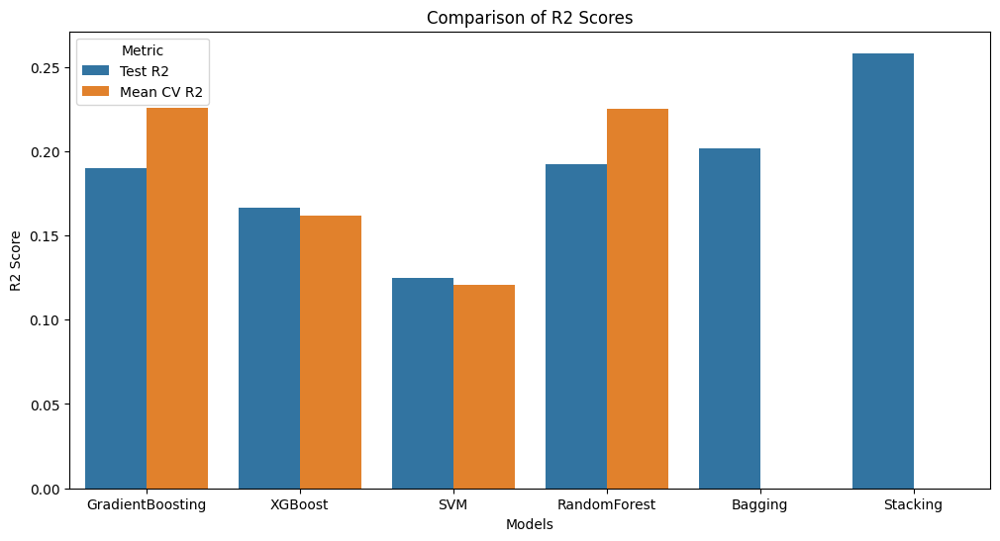

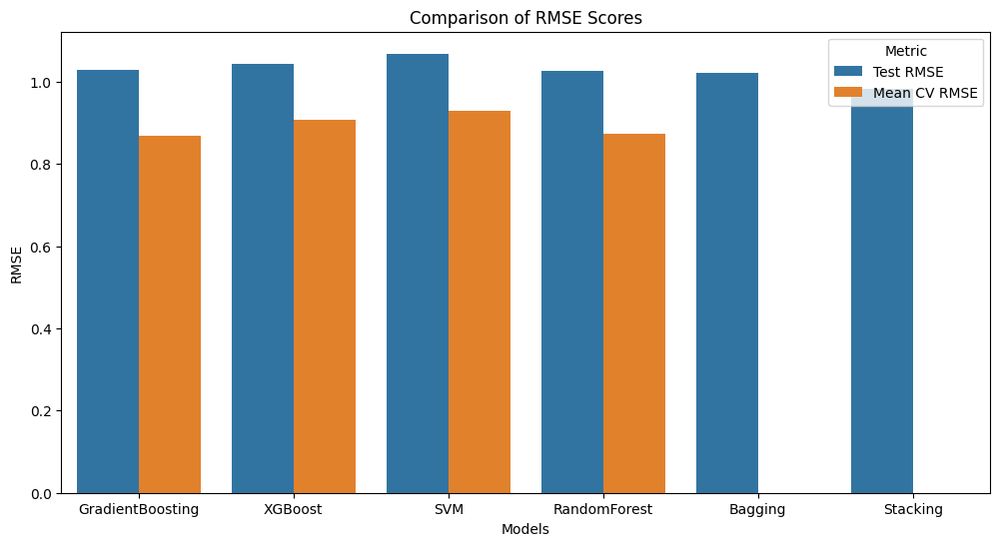

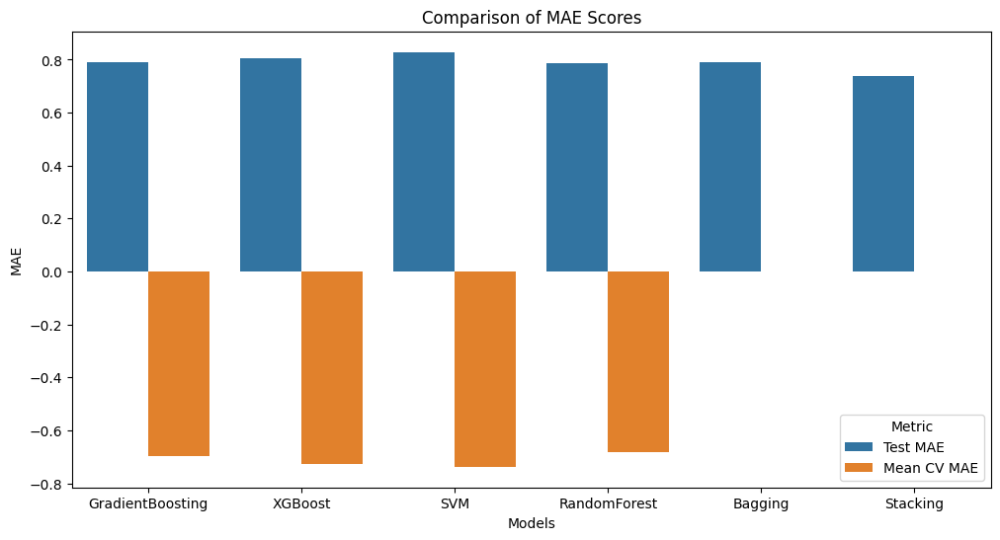

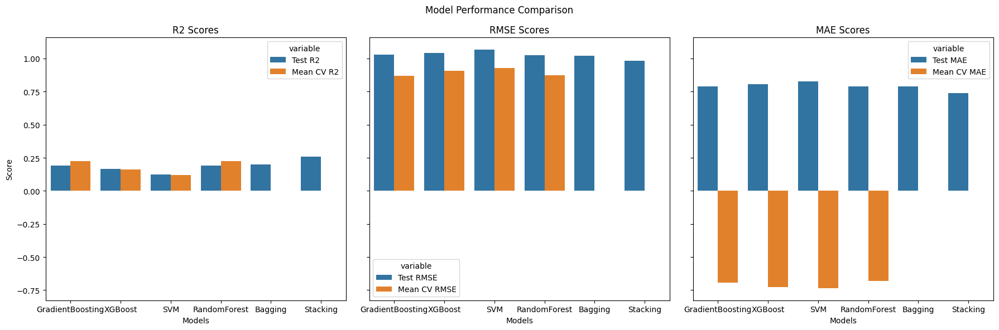

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


# Extracting the results for visualization
model_names = list(results.keys())
r2_scores = [results[model].get('R2', np.nan) for model in model_names]
mean_cv_r2_scores = [results[model].get('Mean CV R2', np.nan) for model in model_names]
rmse_scores = [results[model].get('RMSE', np.nan) for model in model_names]
mean_cv_rmse_scores = [results[model].get('Mean CV RMSE', np.nan) for model in model_names]
mae_scores = [results[model].get('MAE', np.nan) for model in model_names]
mean_cv_mae_scores = [results[model].get('Mean CV MAE', np.nan) for model in model_names]

# Creating a DataFrame for easy plotting
comparison_df = pd.DataFrame({
    'Model': model_names,
    'Test R2': r2_scores,
    'Mean CV R2': mean_cv_r2_scores,
    'Test RMSE': rmse_scores,
    'Mean CV RMSE': mean_cv_rmse_scores,
    'Test MAE': mae_scores,
    'Mean CV MAE': mean_cv_mae_scores
})

# Plotting the R2 scores
plt.figure(figsize=(12, 6))
sns.barplot(x='Model', y='value', hue='variable',
            data=pd.melt(comparison_df, id_vars=['Model'], value_vars=['Test R2', 'Mean CV R2']))
plt.xlabel('Models')
plt.ylabel('R2 Score')
plt.title('Comparison of R2 Scores')
plt.legend(title='Metric')
plt.show()

# Plotting the RMSE scores
plt.figure(figsize=(12, 6))
sns.barplot(x='Model', y='value', hue='variable',
            data=pd.melt(comparison_df, id_vars=['Model'], value_vars=['Test RMSE', 'Mean CV RMSE']))
plt.xlabel('Models')
plt.ylabel('RMSE')
plt.title('Comparison of RMSE Scores')
plt.legend(title='Metric')
plt.show()

# Plotting the MAE scores
plt.figure(figsize=(12, 6))
sns.barplot(x='Model', y='value', hue='variable',
            data=pd.melt(comparison_df, id_vars=['Model'], value_vars=['Test MAE', 'Mean CV MAE']))
plt.xlabel('Models')
plt.ylabel('MAE')
plt.title('Comparison of MAE Scores')
plt.legend(title='Metric')
plt.show()

# Combined Summary Plot
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)
sns.barplot(ax=axes[0], x='Model', y='value', hue='variable',
            data=pd.melt(comparison_df, id_vars=['Model'], value_vars=['Test R2', 'Mean CV R2']))
axes[0].set_title('R2 Scores')
axes[0].set_xlabel('Models')
axes[0].set_ylabel('Score')

sns.barplot(ax=axes[1], x='Model', y='value', hue='variable',
            data=pd.melt(comparison_df, id_vars=['Model'], value_vars=['Test RMSE', 'Mean CV RMSE']))
axes[1].set_title('RMSE Scores')
axes[1].set_xlabel('Models')
axes[1].set_ylabel('Score')

sns.barplot(ax=axes[2], x='Model', y='value', hue='variable',
            data=pd.melt(comparison_df, id_vars=['Model'], value_vars=['Test MAE', 'Mean CV MAE']))
axes[2].set_title('MAE Scores')
axes[2].set_xlabel('Models')
axes[2].set_ylabel('Score')

fig.suptitle('Model Performance Comparison')
plt.tight_layout()
plt.show()
